In [2]:
# Install required library

# Using tfp-nightly due to https://github.com/tensorflow/probability/issues/1752
!pip install rlds tf_agents dm-reverb[tensorflow] apache_beam tfp-nightly tensorflow-hub

In [3]:
# Download zipped checkpoint folder
!gsutil -m cp -r gs://gresearch/robotics/open_x_embodiment_and_rt_x_oss/rt_1_x_tf_trained_for_002272480_step.zip .

/bin/bash: line 1: gsutil: command not found


In [4]:
# Unzip zipped checkpoint folder

!unzip rt_1_x_tf_trained_for_002272480_step.zip

unzip:  cannot find or open rt_1_x_tf_trained_for_002272480_step.zip, rt_1_x_tf_trained_for_002272480_step.zip.zip or rt_1_x_tf_trained_for_002272480_step.zip.ZIP.


In [5]:
import tensorflow as tf
import tensorflow_datasets as tfds

import rlds
from PIL import Image
import numpy as np
from tf_agents.policies import py_tf_eager_policy
import tf_agents
from tf_agents.trajectories import time_step as ts
from IPython import display
from collections import defaultdict
import matplotlib.pyplot as plt


def as_gif(images):
  # Render the images as the gif:
  images[0].save('/tmp/temp.gif', save_all=True, append_images=images[1:], duration=1000, loop=0)
  gif_bytes = open('/tmp/temp.gif','rb').read()
  return gif_bytes


2024-04-27 11:42:52.098268: I tensorflow/core/util/port.cc:111] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-04-27 11:42:52.131453: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-04-27 11:42:52.283218: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-27 11:42:52.283248: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-27 11:42:52.283869: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to regi

In [6]:
# Load TF model checkpoint
# Replace saved_model_path with path to the parent folder of
# the folder rt_1_x_tf_trained_for_002272480_step.
saved_model_path = "robotics_open_x_embodiment_and_rt_x_oss_rt_1_x_tf_trained_for_002272480_step/rt_1_x_tf_trained_for_002272480_step/"


tfa_policy = py_tf_eager_policy.SavedModelPyTFEagerPolicy(
    model_path=saved_model_path,
    load_specs_from_pbtxt=True,
    use_tf_function=True)

In [7]:
# # Perform one step of inference using dummy input

# Obtain a dummy observation, where the features are all 0
observation = tf_agents.specs.zero_spec_nest(tf_agents.specs.from_spec(tfa_policy.time_step_spec.observation))
# #print(observation.shape)
# #trying to do my own shit
# import PIL
# #print(observation)
# table = PIL.Image.open("table.jpeg")
# table = tf.image.resize_with_pad(table, target_width=320, target_height=256)
# table = tf.cast(table, tf.uint8)
# observation['image'] = table
# #print(observation)
# observation['natural_language_instruction'] = tf.convert_to_tensor('move bread left of the glasses')
# # end of my own shit


# # Construct a tf_agents time_step from the dummy observation
# tfa_time_step = ts.transition(observation, reward=np.zeros((), dtype=np.float32))

# # Initialize the state of the policy
# policy_state = tfa_policy.get_initial_state(batch_size=1)

# # Run inference using the policy
# action = tfa_policy.action(tfa_time_step, policy_state)
# #print(action)

In [8]:
# Create a dataset object to obtain episode from

builder = tfds.builder_from_directory(builder_dir='gs://gresearch/robotics/bridge/0.1.0/')
ds = builder.as_dataset(split='train[:1]')

ds_iterator = iter(ds)

2024-04-27 11:43:10.386764: W tensorflow/tsl/platform/cloud/google_auth_provider.cc:184] All attempts to get a Google authentication bearer token failed, returning an empty token. Retrieving token from files failed with "NOT_FOUND: Could not locate the credentials file.". Retrieving token from GCE failed with "FAILED_PRECONDITION: Error executing an HTTP request: libcurl code 6 meaning 'Couldn't resolve host name', error details: Could not resolve host: metadata.google.internal".


In [9]:
# Obtain the steps from one episode from the dataset

episode = next(ds_iterator)
steps = episode[rlds.STEPS]


{'action': {'open_gripper': <tf.Tensor: shape=(), dtype=bool, numpy=True>, 'rotation_delta': <tf.Tensor: shape=(3,), dtype=float32, numpy=array([ 6.077167e-07, -1.193009e-07,  1.308389e-07], dtype=float32)>, 'terminate_episode': <tf.Tensor: shape=(), dtype=float32, numpy=0.0>, 'world_vector': <tf.Tensor: shape=(3,), dtype=float32, numpy=array([1.9514002e-10, 8.0674190e-11, 2.9859176e-10], dtype=float32)>}, 'is_first': <tf.Tensor: shape=(), dtype=bool, numpy=True>, 'is_last': <tf.Tensor: shape=(), dtype=bool, numpy=False>, 'is_terminal': <tf.Tensor: shape=(), dtype=bool, numpy=False>, 'observation': {'image': <tf.Tensor: shape=(480, 640, 3), dtype=uint8, numpy=
array([[[ 83,  88,  91],
        [ 92,  97, 100],
        [ 95, 100, 103],
        ...,
        [ 12,  16,  19],
        [ 11,  15,  18],
        [ 11,  15,  18]],

       [[ 99, 104, 107],
        [112, 117, 120],
        [ 77,  82,  85],
        ...,
        [ 12,  16,  19],
        [ 12,  16,  19],
        [ 11,  15,  18]],

 

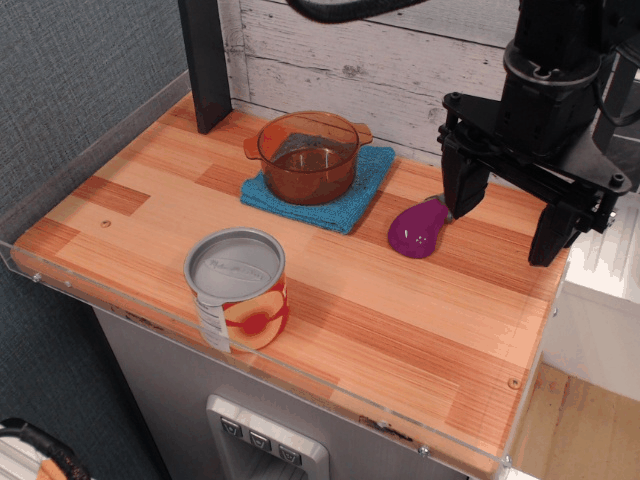

In [10]:
images = []

for step in steps:
  print(step)
  im = Image.fromarray(np.array(step['observation']['image']))
  images.append(im)
print(f'{len(images)} images')

display.Image(as_gif(images))

In [11]:
def resize(image):
  image = tf.image.resize_with_pad(image, target_width=320, target_height=256)
  #print(image)
  image = tf.cast(image, tf.uint8)
  return image

def terminate_bool_to_act(terminate_episode: tf.Tensor) -> tf.Tensor:
  return tf.cond(
      terminate_episode == tf.constant(1.0),
      lambda: tf.constant([1, 0, 0], dtype=tf.int32),
      lambda: tf.constant([0, 1, 0], dtype=tf.int32),
  )

def rescale_action_with_bound(
    actions: tf.Tensor,
    low: float,
    high: float,
    safety_margin: float = 0,
    post_scaling_max: float = 1.0,
    post_scaling_min: float = -1.0,
) -> tf.Tensor:
  """Formula taken from https://stats.stackexchange.com/questions/281162/scale-a-number-between-a-range."""
  resc_actions = (actions - low) / (high - low) * (
      post_scaling_max - post_scaling_min
  ) + post_scaling_min
  return tf.clip_by_value(
      resc_actions,
      post_scaling_min + safety_margin,
      post_scaling_max - safety_margin,
  )

def rescale_action(action):
  """Rescales action."""

  action['world_vector'] = rescale_action_with_bound(
      action['world_vector'],
      low=-0.05,
      high=0.05,
      safety_margin=0.01,
      post_scaling_max=1.75,
      post_scaling_min=-1.75,
  )
  action['rotation_delta'] = rescale_action_with_bound(
      action['rotation_delta'],
      low=-0.25,
      high=0.25,
      safety_margin=0.01,
      post_scaling_max=1.4,
      post_scaling_min=-1.4,
  )

  return action

def to_model_action(from_step):
  """Convert dataset action to model action. This function is specific for the Bridge dataset."""

  model_action = {}

  model_action['world_vector'] = from_step['action']['world_vector']
  model_action['terminate_episode'] = terminate_bool_to_act(
      from_step['action']['terminate_episode']
  )

  model_action['rotation_delta'] = from_step['action']['rotation_delta']

  open_gripper = from_step['action']['open_gripper']

  possible_values = tf.constant([True, False], dtype=tf.bool)
  eq = tf.equal(possible_values, open_gripper)

  assert_op = tf.Assert(tf.reduce_any(eq), [open_gripper])

  with tf.control_dependencies([assert_op]):
    model_action['gripper_closedness_action'] = tf.cond(
        # for open_gripper in bridge dataset,
        # 0 is fully closed and 1 is fully open
        open_gripper,
        # for Fractal data,
        # gripper_closedness_action = -1 means opening the gripper and
        # gripper_closedness_action = 1 means closing the gripper.
        lambda: tf.constant([-1.0], dtype=tf.float32),
        lambda: tf.constant([1.0], dtype=tf.float32),
    )

  model_action = rescale_action(model_action)

  return model_action

In [12]:
# %%time
steps = list(steps)

policy_state = tfa_policy.get_initial_state(batch_size=1)

gt_actions = []
predicted_actions_baseline = []
images = []

for step in steps:

  image = resize(step[rlds.OBSERVATION]['image'])
  images.append(image)
  observation['image'] = image
  

  tfa_time_step = ts.transition(observation, reward=np.zeros((), dtype=np.float32))

  policy_step = tfa_policy.action(tfa_time_step, policy_state)
  action = policy_step.action
  #print(action)
  policy_state = policy_step.state

  predicted_actions_baseline.append(action)
  gt_actions.append(to_model_action(step))

In [13]:
# import tensorflow_hub as hub
embedder = tf.saved_model.load("sentence_encoder")#hub.load("https://tfhub.dev/google/universal-sentence-encoder-large/5")#

In [14]:
print(step[rlds.OBSERVATION]["natural_language_instruction"])
# Place the can to the left of the pot.
step[rlds.OBSERVATION]["natural_language_instruction"] = "zzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzz"#"discuss the cup to the left of the pot."
step[rlds.OBSERVATION]['natural_language_embedding'] = embedder(["zzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzz"])[0].numpy()

tf.Tensor(b'Place the can to the left of the pot.', shape=(), dtype=string)


In [26]:
# %%time
steps = list(steps)

policy_state = tfa_policy.get_initial_state(batch_size=1)

gt_actions = []
predicted_actions_to_compare = []
images = []
natural_language_instruction = "zzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzz"#"discuss the cup to the left of the pot."
natural_language_embedding = embedder(["zzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzz"])[0].numpy()
  
for step in steps:
  prev = step[rlds.OBSERVATION]['natural_language_embedding']
  image = resize(step[rlds.OBSERVATION]['image'])
  
  step[rlds.OBSERVATION]['natural_language_instruction'] = natural_language_instruction
  step[rlds.OBSERVATION]['natural_language_embedding'] = natural_language_embedding
  print(step[rlds.OBSERVATION]['natural_language_embedding'])
  images.append(image)
  observation['image'] = image
  

  tfa_time_step = ts.transition(observation, reward=np.zeros((), dtype=np.float32))

  policy_step = tfa_policy.action(tfa_time_step, policy_state)
  action = policy_step.action
  #print(action)
  policy_state = policy_step.state

  predicted_actions_to_compare.append(action)
  gt_actions.append(to_model_action(step))

[-6.65036440e-02 -4.29377928e-02  4.40912321e-02  3.40841375e-02
 -5.96772395e-02 -6.17735088e-02  1.94856301e-02 -1.97925083e-02
 -5.37429787e-02  1.08183781e-02 -1.27400449e-02 -8.50247405e-03
 -3.12510505e-02 -1.88233536e-02 -1.36381313e-02  2.31672041e-02
  4.36649621e-02 -4.57639024e-02 -9.27961431e-03  4.52854447e-02
  3.74007598e-02 -2.34254766e-02  2.25083083e-02 -4.36867066e-02
 -3.35309119e-03 -7.67217297e-03  2.32431060e-03 -2.39134356e-02
 -2.83389892e-02  6.88896552e-02  6.29486516e-02  1.90614327e-03
  5.68466298e-02  3.06356717e-02  7.91178122e-02 -4.75799553e-02
 -4.25341316e-02  4.54225391e-02  1.40427635e-03 -4.71070409e-03
 -2.39200387e-02 -6.02626204e-02 -3.02730780e-02  1.28100617e-02
  8.97167530e-03  2.08644588e-02 -2.32816264e-02  4.60772105e-02
 -3.60626467e-02 -1.05554312e-02 -2.84690671e-02 -5.20120040e-02
 -1.64802113e-05 -6.87319562e-02  4.32479987e-03  1.13655264e-02
  2.33917893e-03  5.04627414e-02 -6.30062167e-03  2.66494812e-03
  3.05018132e-03 -4.93219

KeyboardInterrupt: 

In [21]:
action_name_to_values_over_time = defaultdict(list)
predicted_action_name_to_values_over_time_baseline = defaultdict(list)
predicted_action_name_to_values_over_time_to_compare = defaultdict(list)

figure_layout = ['terminate_episode_0', 'terminate_episode_1',
        'terminate_episode_2', 'world_vector_0', 'world_vector_1',
        'world_vector_2', 'rotation_delta_0', 'rotation_delta_1',
        'rotation_delta_2', 'gripper_closedness_action_0']
action_order = ['terminate_episode', 'world_vector', 'rotation_delta', 'gripper_closedness_action']

for i, action in enumerate(gt_actions):

  for action_name in action_order:

    for action_sub_dimension in range(action[action_name].shape[0]):

      # print(action_name, action_sub_dimension)
      title = f'{action_name}_{action_sub_dimension}'

      action_name_to_values_over_time[title].append(action[action_name][action_sub_dimension])
      predicted_action_name_to_values_over_time_baseline[title].append(predicted_actions_baseline[i][action_name][action_sub_dimension])
      predicted_action_name_to_values_over_time_to_compare[title].append(predicted_actions_to_compare[i][action_name][action_sub_dimension])


In [23]:
figure_layout = [
    ['image'] * len(figure_layout),
    figure_layout
]


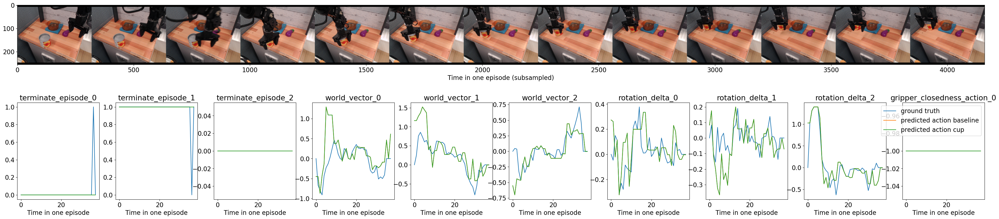

In [24]:
plt.rcParams.update({'font.size': 16})

stacked = tf.concat(tf.unstack(images[::3], axis=0), 1)

fig, axs = plt.subplot_mosaic(figure_layout)
fig.set_size_inches([45, 10])

for i, (k, v) in enumerate(action_name_to_values_over_time.items()):

  axs[k].plot(v, label='ground truth')
  axs[k].plot(predicted_action_name_to_values_over_time_baseline[k], label='predicted action baseline')
  axs[k].plot(predicted_action_name_to_values_over_time_to_compare[k], label="predicted action cup")
  axs[k].set_title(k)
  axs[k].set_xlabel('Time in one episode')

axs['image'].imshow(stacked.numpy())
axs['image'].set_xlabel('Time in one episode (subsampled)')

plt.legend()
plt.savefig("uhhh.jpg")


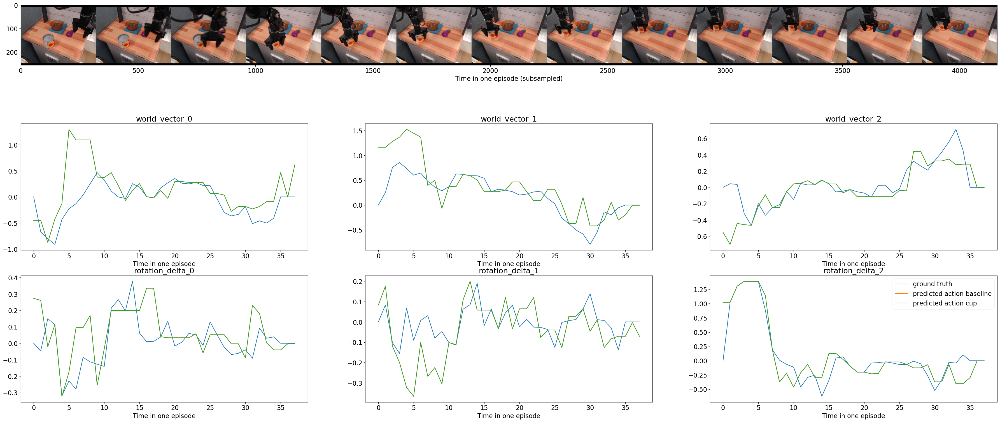

In [25]:
# action_names = action_name_to_values_over_time.items()

# first_row_actions = action_names[3:6]
# second_row_actions = action_names[7:9]

# Create a layout for the subplot mosaic with two rows
plt.rcParams.update({'font.size': 16})

figure_layout = [#'terminate_episode_0', 'terminate_episode_1',
        #'terminate_episode_2', 
      ['world_vector_0', 'world_vector_1','world_vector_2'],
        ['rotation_delta_0', 'rotation_delta_1','rotation_delta_2']
          #'gripper_closedness_action_0'
        ]

figure_layout = [
    ['image'] * len(figure_layout[0]),
    figure_layout[0],
    figure_layout[1]
]

# Create the subplot mosaic with the new layout.
fig, axs = plt.subplot_mosaic(figure_layout)
fig.set_size_inches([45, 20])  # Adjust the size accordingly

for i, (k, v) in enumerate(action_name_to_values_over_time.items()):
  if i<3:
    continue
  elif i>=9:
    break 
  axs[k].plot(v, label='ground truth')
  axs[k].plot(predicted_action_name_to_values_over_time_baseline[k], label='predicted action baseline')
  axs[k].plot(predicted_action_name_to_values_over_time_to_compare[k], label="predicted action cup")
  axs[k].set_title(k)
  axs[k].set_xlabel('Time in one episode')

axs['image'].imshow(stacked.numpy())
axs['image'].set_xlabel('Time in one episode (subsampled)')

plt.legend()
plt.savefig("uhhh.jpg")